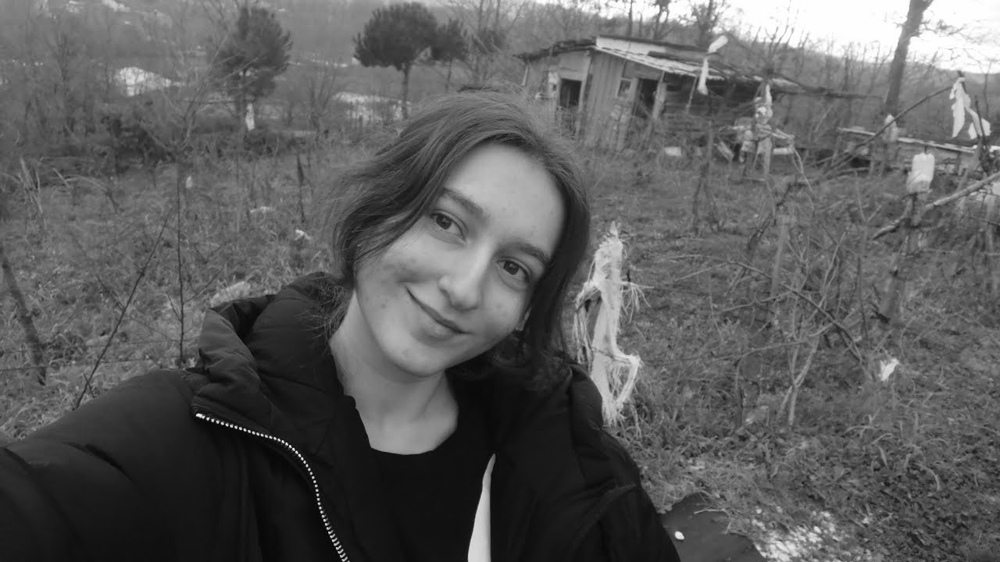

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
#içe aktarma
img=cv2.imread("IMG-20240125-WA0061.jpg",0)
#görselleştır
cv2_imshow(img)
k=cv2.waitKey(0) &0xFF
if k==27: #esc
  cv2.destroyAllWindows()
elif k==ord('s'):
  cv2.imwrite("nuray_gray.png",img)
  cv2.destroyAllWindows()





genişlik 1920.0
yüksekik 1080.0


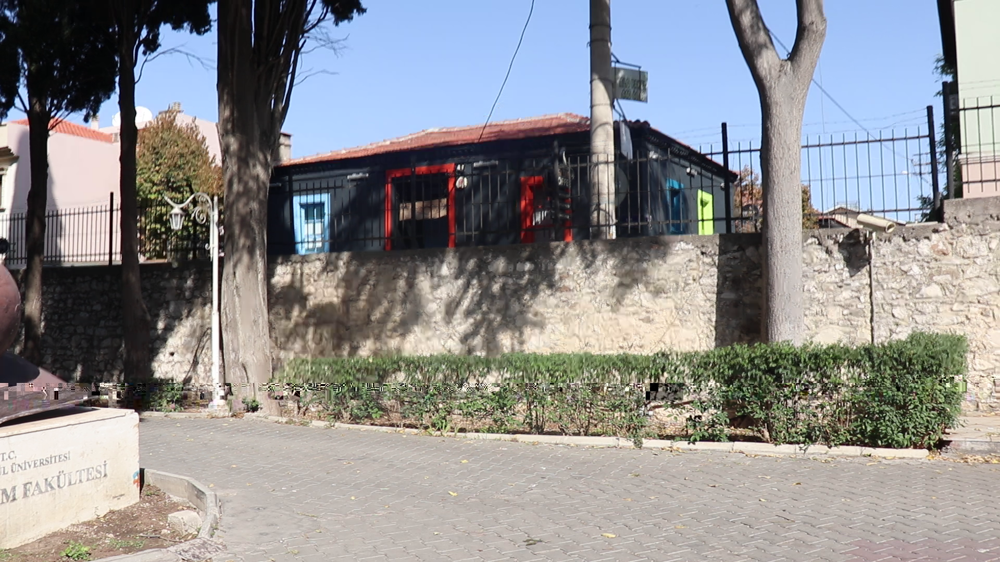

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import time
#video ismi
video_name= "/content/MVI_1100 - Kopya.MP4"
#videodan içe akar
cap=cv2.VideoCapture(video_name)

print("genişlik",cap.get(3))
print("yüksekik",cap.get(4))

if cap.isOpened()==False:
  print("hata")

while True:
 ret,frame=cap.read()

 if ret==True:
   time.sleep(0.01) #kullanmazsak cok hızlı akar
   cv2_imshow(frame)
 else: break

 if cv2.waitKey(1) & 0xFF==ord("q"):
   break


cap.release() #stop capture
cv2.destroyAllWindows()



In [ ]:


#kameradan video kaydı alma
from google.colab.patches import cv2_imshow
import cv2

# Kamerayı başlat
cap = cv2.VideoCapture(0)

# Karelerin boyutunu al
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
print(width, height)

# VideoWriter nesnesini oluştur
writer = cv2.VideoWriter("video_kaydi.mp4", cv2.VideoWriter_fourcc('D', 'I', 'V', 'X'), 20, (width, height))

while True:
    # Kameradan bir kare al
    ret, frame = cap.read()

    # Kare alındıysa
    if ret:
        # Kareyi görüntüle
        cv2_imshow(frame)

        # Video dosyasına yaz
        writer.write(frame)

        # 'q' tuşuna basıldığında döngüyü kır
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break

# Video dosyasını kapat
writer.release()

# Kamerayı serbest bırak
cap.release()
cv2.destroyAllWindows()




0 0


resim boyutu: (720, 1280)


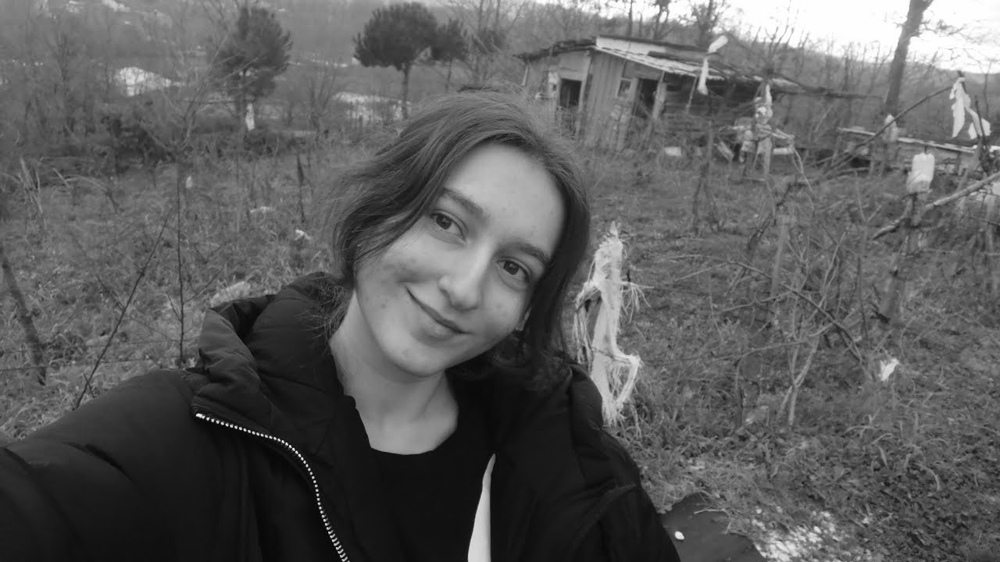

resied img shape (72, 128)


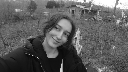

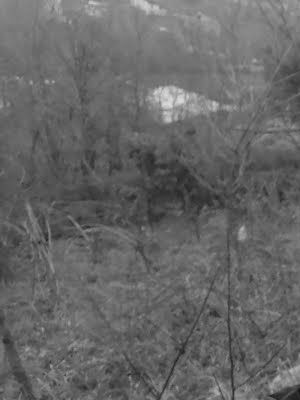

In [ ]:
#yeniden boyutlandır ve kırpma
import cv2
from google.colab.patches import cv2_imshow

img=cv2.imread("nuray.jpg",0)
print("resim boyutu:",img.shape)
cv2_imshow(img)

imgResize=cv2.resize(img,(128,72))
print("resied img shape",imgResize.shape)
cv2_imshow(imgResize)

#kırpma
imgCropped=img[:400,:300] #yükseklil,genişlik
cv2_imshow(imgCropped)

(512, 512, 3)


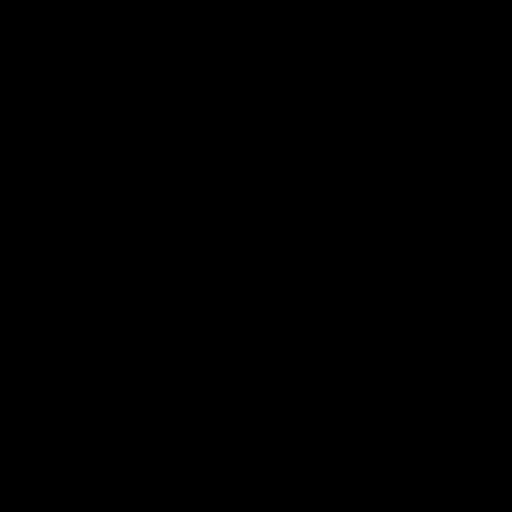

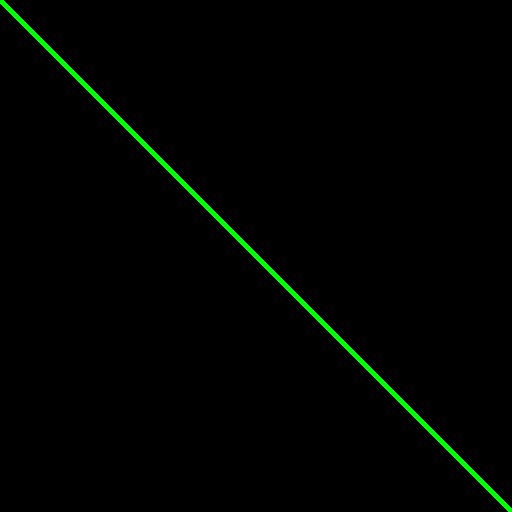

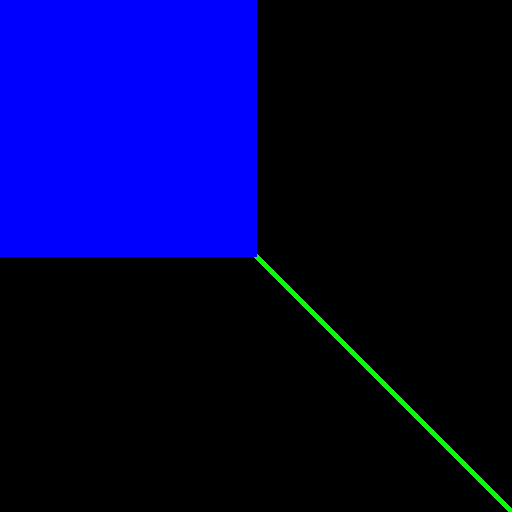

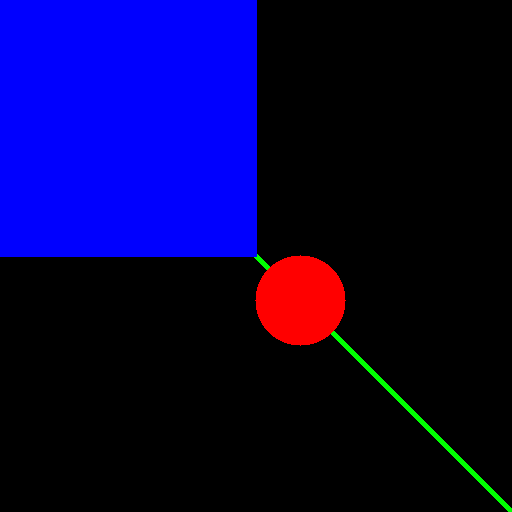

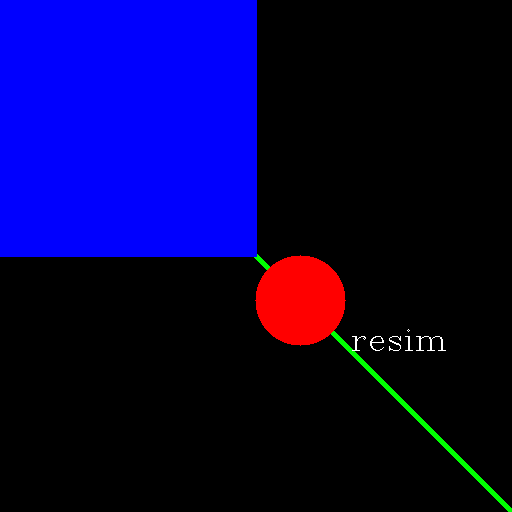

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
#resim oluştur
img=np.zeros((512,512,3),np.uint8) #siyah bir resim
print(img.shape)

cv2_imshow(img)
#çizgi
cv2.line(img,(0,0),(512,512),(0,255,0),3)
#resim, başlangiç nokası,bitiş noktası,renk kalınlık
cv2_imshow(img)

#dikdortgen
cv2.rectangle(img,(0,0),(256,256),(255,0,0),cv2.FILLED)#resim,başlangıç,bitiş,renk
cv2_imshow(img)

#çember
cv2.circle(img,(300,300),45,(0,0,255),cv2.FILLED)
cv2_imshow(img)

#metin
#resim,başlangıç,font,kalınlık,renk
cv2.putText(img,"resim",(350,350),cv2.FONT_HERSHEY_COMPLEX,1,(255,255,255))
cv2_imshow(img)

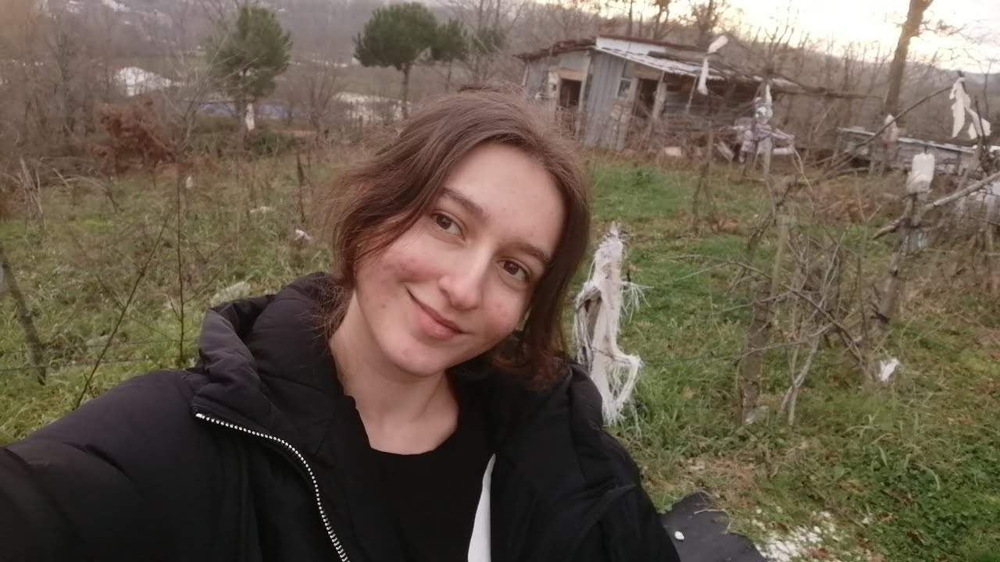

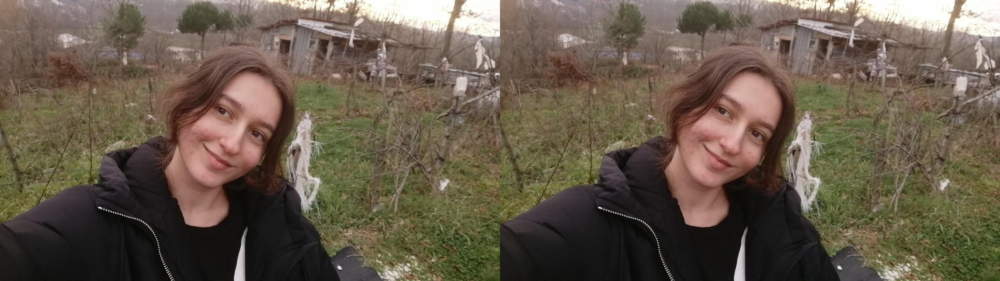

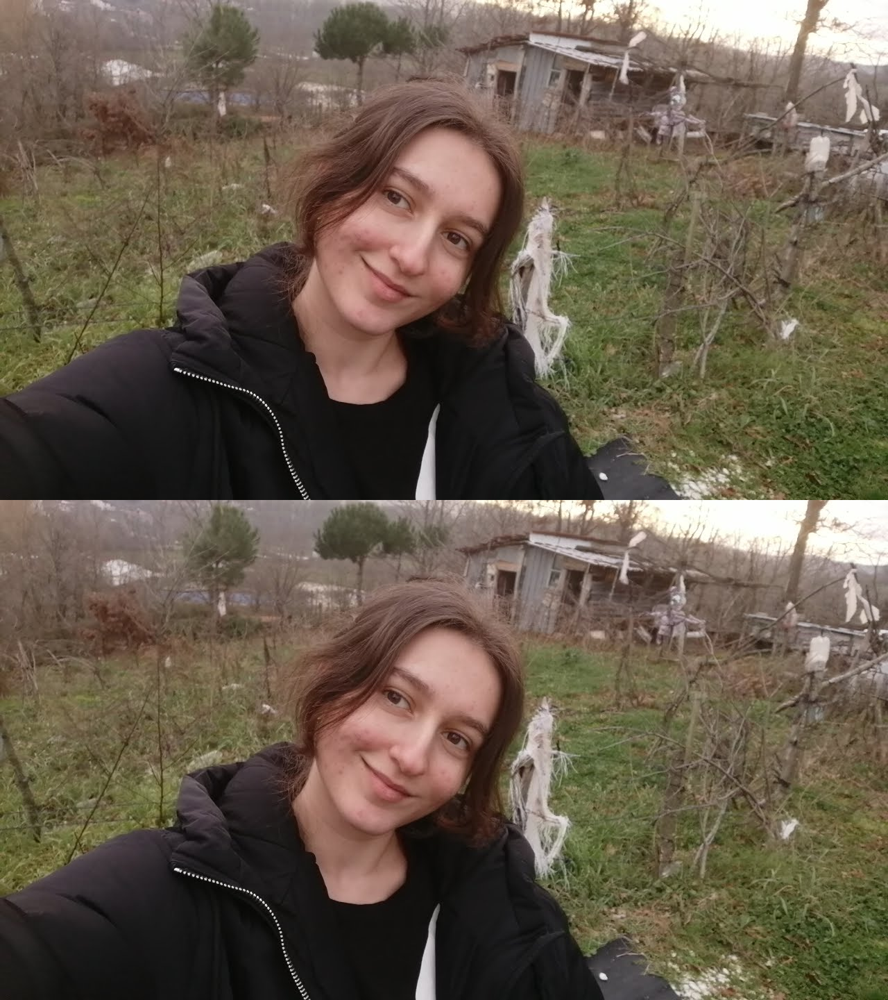

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

img=cv2.imread("nuray.jpg")
cv2_imshow(img)

#yanyana birleştirme
hor=np.hstack((img,img))
cv2_imshow(hor)

#dikey birleştirme
ver=np.vstack((img,img))
cv2_imshow(ver)

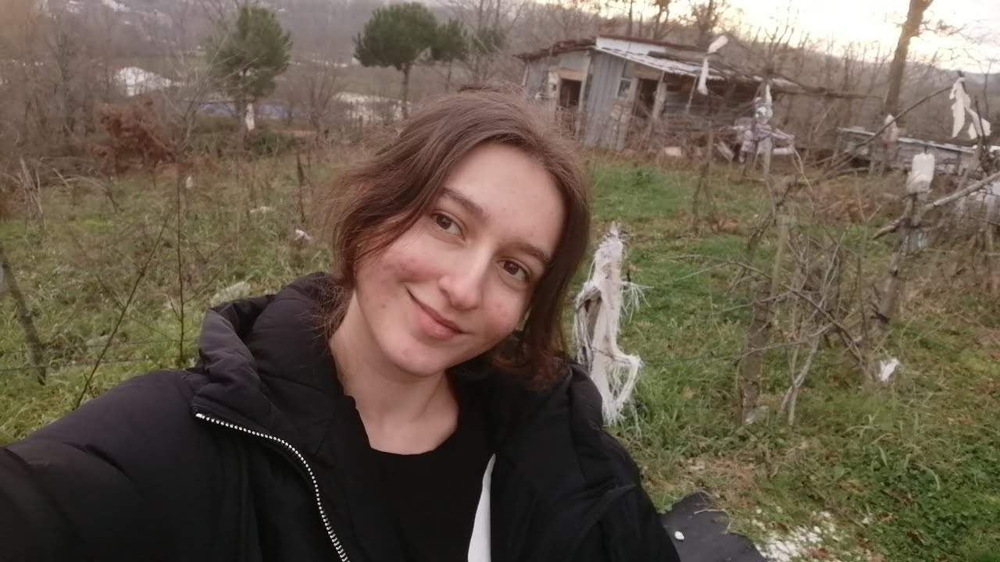

[[ 8.00143452e-01  2.57295199e-01 -3.49320620e+02]
 [-2.37591437e-01  4.67239087e-01  9.93767710e+01]
 [ 8.28376762e-04 -1.15613634e-03  1.00000000e+00]]


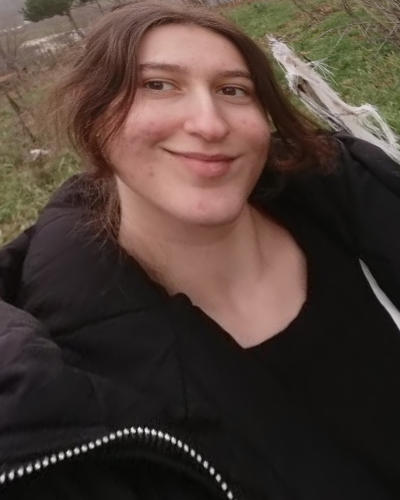

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

#perspektif ayarlama
#resmi içe aktar
img=cv2.imread("nuray.jpg")
cv2_imshow(img)

width=400
height=500
pts1=np.float32([[434,8],[261,546],[1081,337],[516,705]])
pts2=np.float32([[0,0],[0,height],[width,0],[width,height]])

matrix=cv2.getPerspectiveTransform(pts1,pts2)
print(matrix)

#dönüştürülmüş resim
imgO=cv2.warpPerspective(img,matrix,(width,height))
cv2_imshow(imgO)


resim boyutu1: (720, 1280, 3)
resim boyutu: (1754, 1240, 3)
(700, 700, 3)
(700, 700, 3)


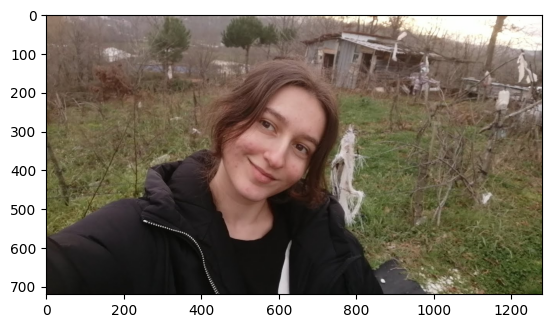

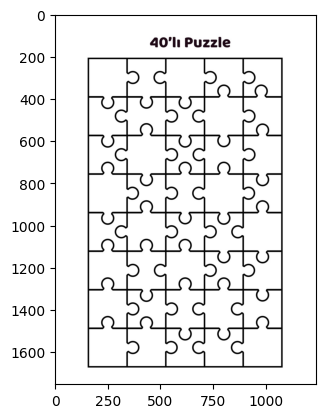

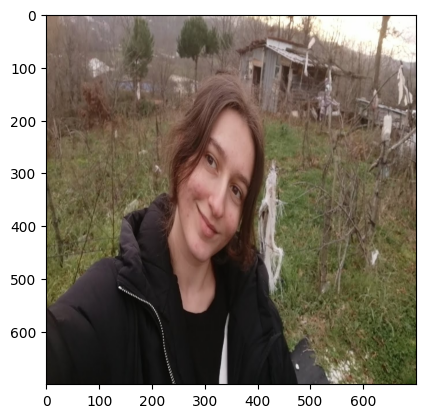

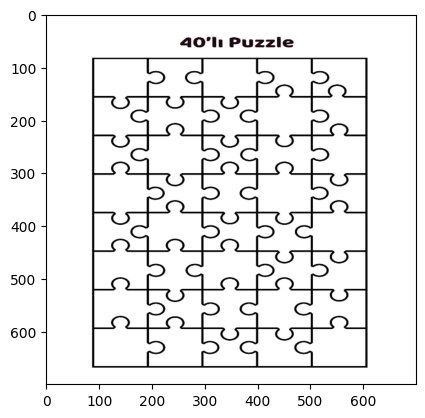

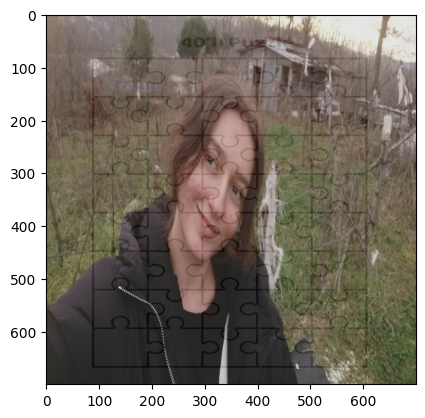

In [ ]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

img1=cv2.imread("nuray.jpg")
img1=cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2=cv2.imread("foto.jpg")
img2=cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

plt.figure()
plt.imshow(img1)

plt.figure()
plt.imshow(img2)

print("resim boyutu1:",img1.shape)
print("resim boyutu:",img2.shape)

img1=cv2.resize(img1,(700,700))
print(img1.shape)
img2=cv2.resize(img2,(700,700))
print(img2.shape)

plt.figure()
plt.imshow(img1)
plt.figure()
plt.imshow(img2)

#kariştirilmiş resim=alpha katsayısı*img2 + beta*img2
blended=cv2.addWeighted(src1=img1,alpha=0.8,src2= img2,beta=0.1,gamma=0)
plt.figure()
plt.imshow(blended)


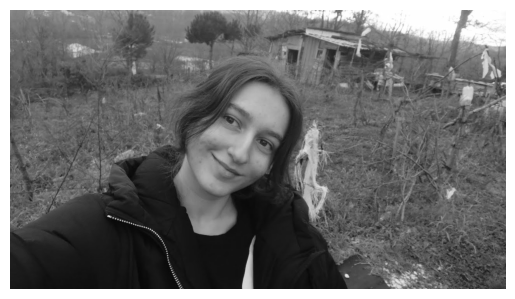

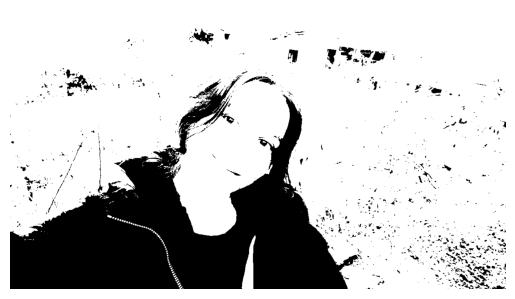

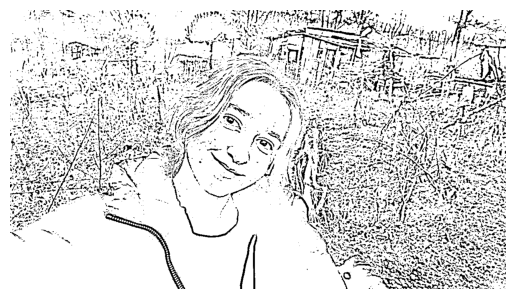

In [2]:
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

img=cv2.imread("nuray.jpg")
img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
plt.figure()
plt.imshow(img, cmap="gray")
plt.axis("off")
plt.show()

#eşikleme
_, thresh_img=cv2.threshold(img,thresh=60,maxval=255,type=cv2.THRESH_BINARY)
plt.figure()
plt.imshow(thresh_img,cmap="gray")
plt.axis("off")
plt.show()

#uyarlamalı eşik değeri
thresh_img2=cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,8)
plt.figure()
plt.imshow(thresh_img2,cmap="gray")
plt.axis("off")
plt.show()

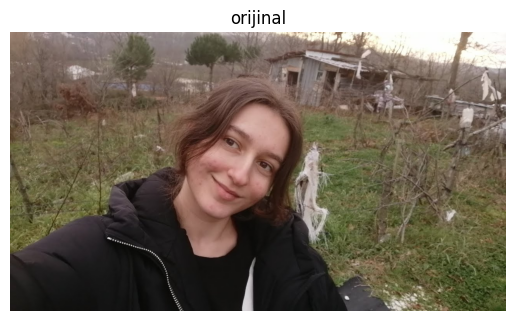

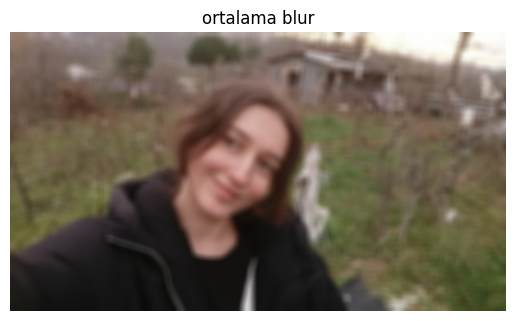

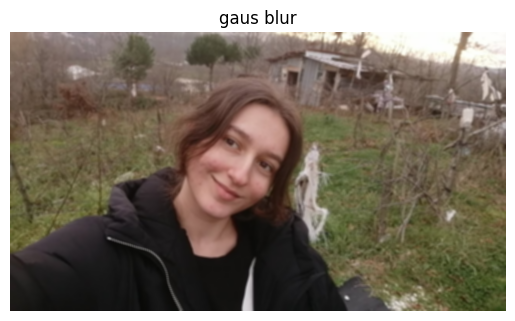

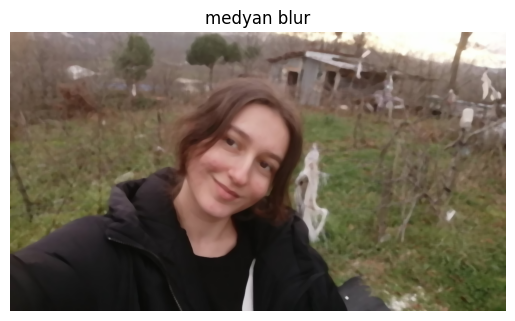

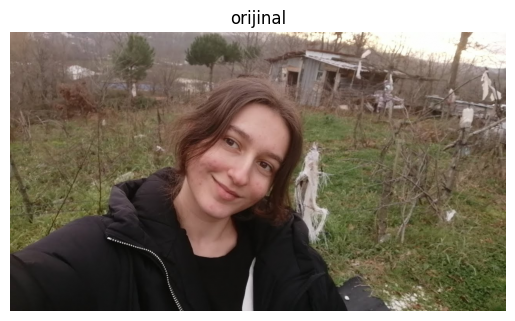

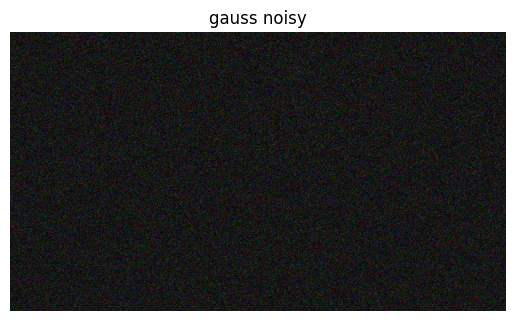

(<Figure size 640x480 with 1 Axes>,
 (-0.5, 1279.5, 719.5, -0.5),
 Text(0.5, 1.0, 'sp image'))

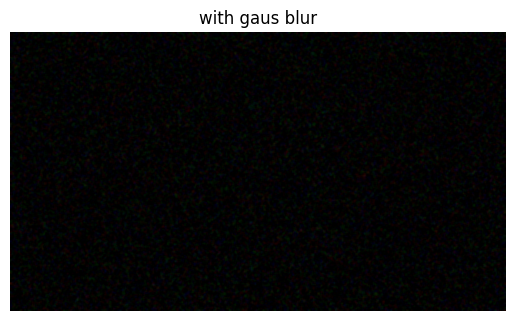

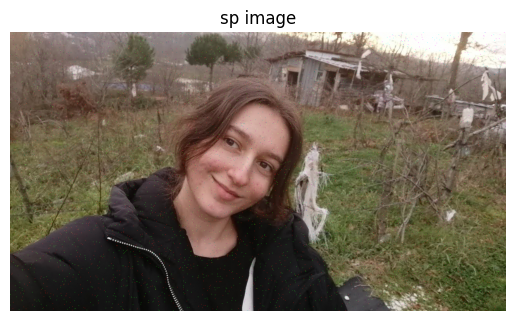

In [26]:
#bulanıklaştırma
import cv2
import matplotlib.pyplot as plt
import numpy as np
import warnings
from google.colab.patches import cv2_imshow
warnings.filterwarnings("ignore")

#blurring detayı azaltır, gürültüyü engeller
img=cv2.imread("nuray.jpg")
img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(img),plt.axis("off"), plt.title("orijinal"), plt.show()

##ORTALAMA BULANIKLAŞTIRMA
dst2=cv2.blur(img,ksize=(20,20))
plt.figure(),plt.imshow(dst2),plt.axis("off"),plt.title("ortalama blur")

##GAUSİAN BULANIKLAŞTIRMA
gb=cv2.GaussianBlur(img,ksize=(7,7),sigmaX=7)
plt.figure(),plt.imshow(gb),plt.axis("off"),plt.title("gaus blur")

##MEDİAN BULANIKLAŞTIRMA
mb=cv2.medianBlur(img,ksize=9)
plt.figure(),plt.imshow(mb),plt.axis("off"),plt.title("medyan blur")

def gaussiannoise(image):
  row,col,ch=image.shape
  mean=0
  var=0.05
  sigma=var**0.5
  gauss=np.random.normal(mean,sigma,(row,col,ch))
  gauss=gauss.reshape(row,col,ch)
  noisy=image=gauss
  return  noisy

#0 la 1 arasına tasımak için normalize edicez(içe aktar)
img=cv2.imread("nuray.jpg")
img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)/255
plt.figure()
plt.imshow(img)
plt.axis("off"), plt.title("orijinal"), plt.show()

gaussiannoiseimage=gaussiannoise(img)
plt.figure()
plt.imshow(gaussiannoiseimage),plt.axis("off"), plt.title("gauss noisy"), plt.show()

#gauss blur
gb2=cv2.GaussianBlur(gaussiannoiseimage,ksize=(7,7),sigmaX=7)
plt.figure(),plt.imshow(gb2),plt.axis("off"),plt.title("with gaus blur")

def saltpeppernoise(image):
  row,col,ch=image.shape
  s_vs_p=0.5
  amount= 0.004
  noisy=np.copy(image)
  #salt beyaz noktacık
  #num_salt=np.ceil(amount*image.size*s_vs_p)
  num_salt = np.ceil(amount * np.prod(image.shape) * s_vs_p)
  coords=[np.random.randint(0,i-1,int(num_salt)) for i in image.shape]
  #noisy[coords]=1
  noisy[tuple(coords)] = 255

  #pepper siyah noktalar
  #num_pepper=np.ceil(amount*image.size*(1-s_vs_p))
  num_pepper = np.ceil(amount * np.prod(image.shape) * (1. - s_vs_p))
  coords=[np.random.randint(0,i-1,int(num_pepper)) for i in image.shape]
  #noisy[coords]=1
  noisy[tuple(coords)] = 0

  return noisy

spimage=saltpeppernoise(img)
plt.figure(),plt.imshow(spimage),plt.axis("off"),plt.title("sp image")














(<Figure size 640x480 with 1 Axes>,
 (-0.5, 4799.5, 4799.5, -0.5),
 Text(0.5, 1.0, 'GRADYAN'))

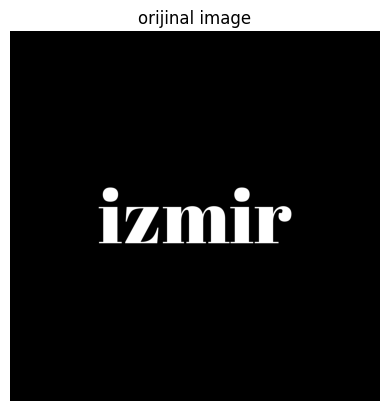

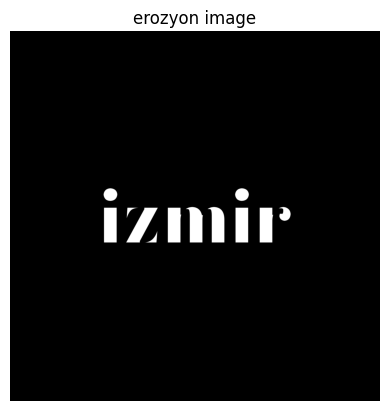

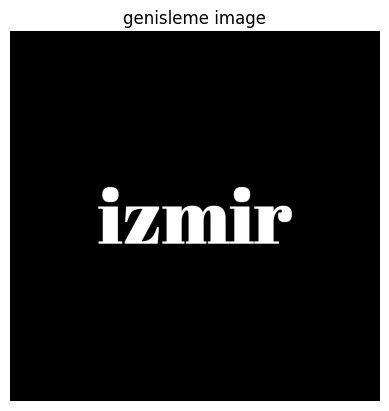

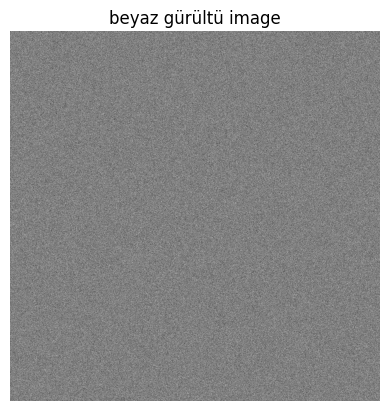

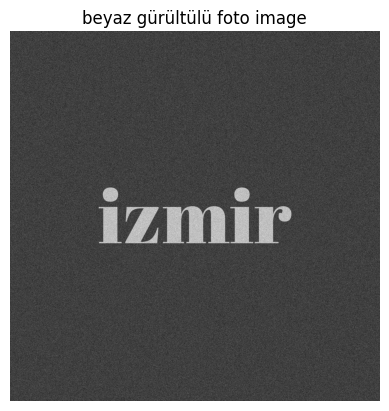

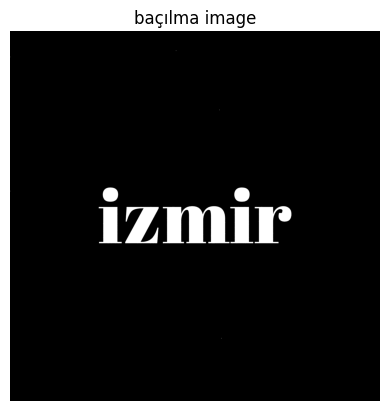

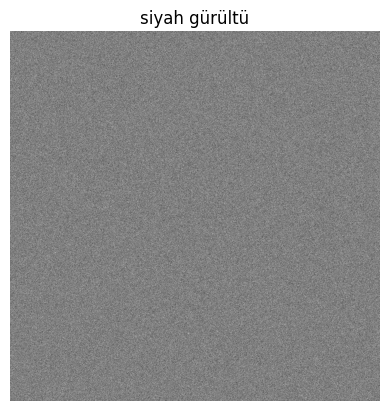

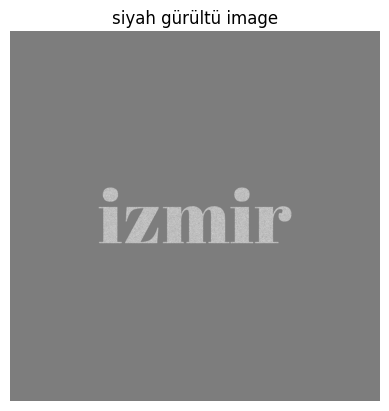

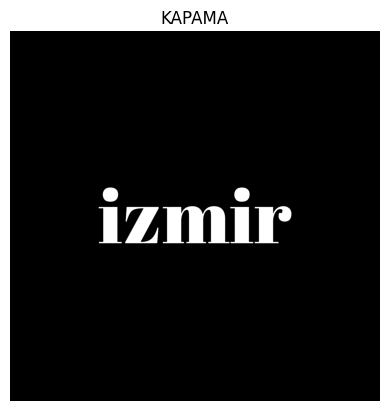

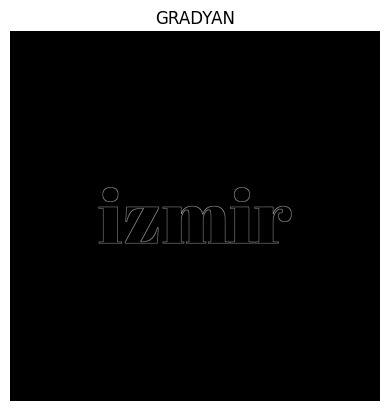

In [37]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import warnings
from google.colab.patches import cv2_imshow

img=cv2.imread("izmir.jpg",0)
plt.figure(),plt.imshow(img,cmap="gray"),plt.axis("off"),plt.title("orijinal image")

#erozyon
kernel=np.ones((5,5),dtype=np.uint8)
result=cv2.erode(img,kernel,iterations=5)
plt.figure(),plt.imshow(result,cmap="gray"),plt.axis("off"),plt.title("erozyon image")

#genişleme dilation
result2=cv2.dilate(img,kernel,iterations=3)
plt.figure(),plt.imshow(result2,cmap="gray"),plt.axis("off"),plt.title("genisleme image")



#white noise
whitenoise=np.random.randint(0,2,size=img.shape[:2])
whitenoise=whitenoise*255
plt.figure(),plt.imshow(whitenoise,cmap="gray"), plt.axis("off"),plt.title("beyaz gürültü image")


noise_img=whitenoise+img
plt.figure(),plt.imshow(noise_img,cmap="gray"), plt.axis("off"),plt.title("beyaz gürültülü foto image")


#açılma
opening=cv2.morphologyEx(noise_img.astype(np.float32),cv2.MORPH_OPEN,kernel)
plt.figure(),plt.imshow(opening,cmap="gray"), plt.axis("off"),plt.title("baçılma image")


#kapatma
blacknoise=np.random.randint(0,2,size=img.shape[:2])
blacknoise=blacknoise*-255
plt.figure(),plt.imshow(blacknoise,cmap="gray"), plt.axis("off"),plt.title("siyah gürültü")

black_noise_img=blacknoise+img
black_noise_img[black_noise_img<=-245]=0
plt.figure(),plt.imshow(black_noise_img,cmap="gray"), plt.axis("off"),plt.title("siyah gürültü image")


#kapatma
closing=cv2.morphologyEx(black_noise_img.astype(np.float32),cv2.MORPH_CLOSE,kernel)
plt.figure(),plt.imshow(closing,cmap="gray"), plt.axis("off"),plt.title("KAPAMA")

#gradient
gradient=cv2.morphologyEx(img,cv2.MORPH_GRADIENT,kernel)
plt.figure(),plt.imshow(gradient,cmap="gray"), plt.axis("off"),plt.title("GRADYAN")





(<Figure size 640x480 with 1 Axes>,
 (-0.5, 224.5, 224.5, -0.5),
 Text(0.5, 1.0, 'laplacian gradyan'))

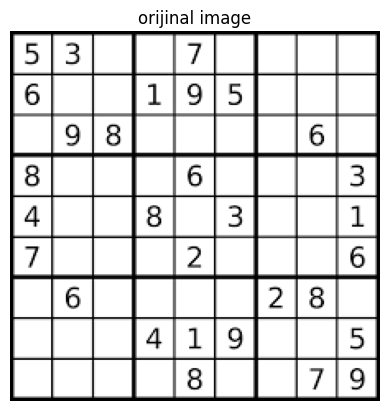

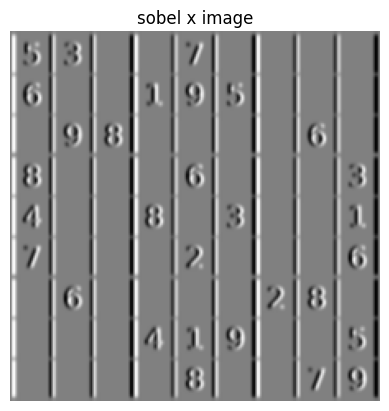

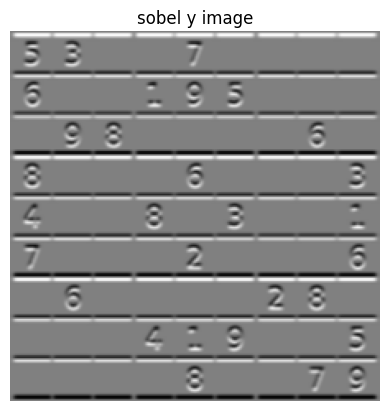

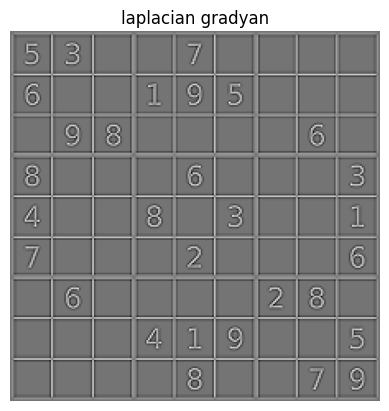

In [44]:
#gradyanlar
#kenar algılama
import cv2
import matplotlib.pyplot as plt
import numpy as np
import warnings
from google.colab.patches import cv2_imshow

img=cv2.imread("download.png",0)
plt.figure(),plt.imshow(img,cmap="gray"),plt.axis("off"),plt.title("orijinal image")

#x gardaynları
sobely = cv2.Sobel(img, ddepth=cv2.CV_16S, dx=1, dy=0, ksize=5)
plt.figure(),plt.imshow(sobelx,cmap="gray"),plt.axis("off"),plt.title("sobel x image")


#y gardaynları
sobely = cv2.Sobel(img, ddepth=cv2.CV_16S, dx=0, dy=1, ksize=5)
plt.figure(),plt.imshow(sobely,cmap="gray"),plt.axis("off"),plt.title("sobel y image")

#laplacian gradyan her ikisi
laplacian=cv2.Laplacian(img,ddepth=cv2.CV_16S)
plt.figure(),plt.imshow(laplacian,cmap="gray"),plt.axis("off"),plt.title("laplacian gradyan")



(720, 1280, 3)
(256, 1)
(225, 225, 3)


(<Figure size 640x480 with 1 Axes>,
 <matplotlib.image.AxesImage at 0x7aca0035c190>)

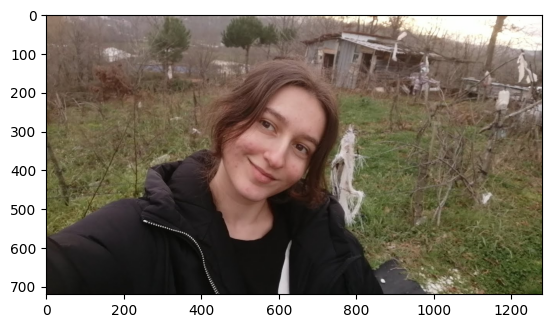

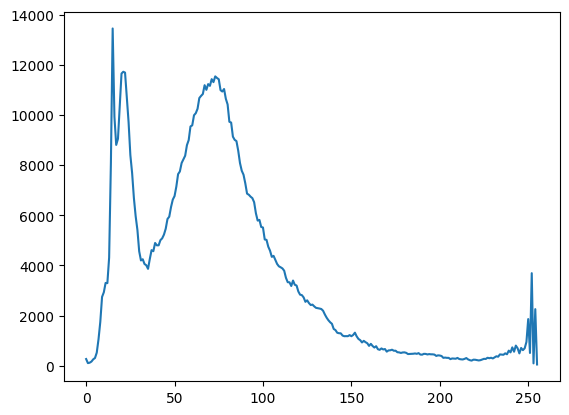

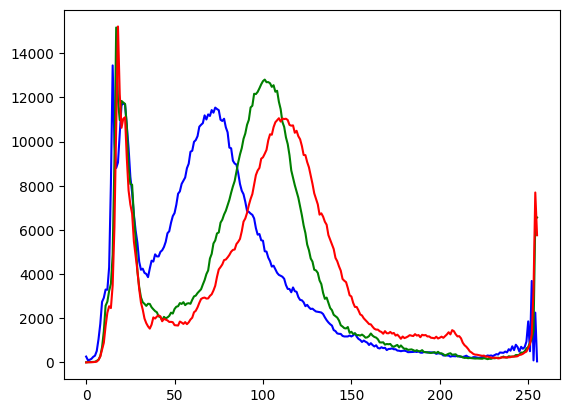

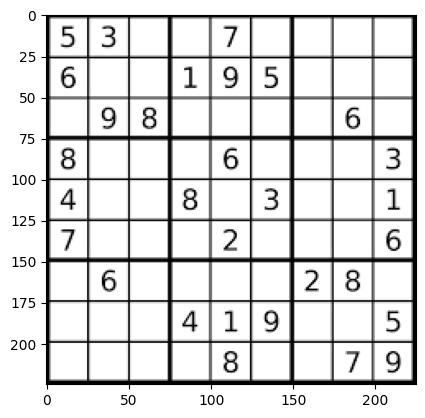

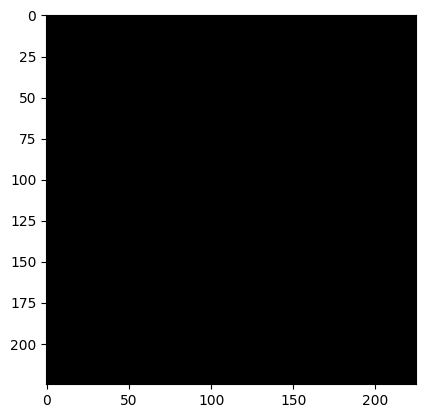

...

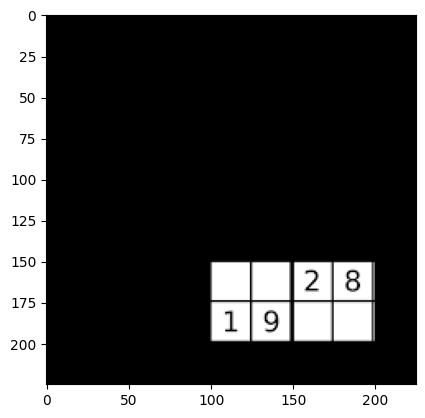

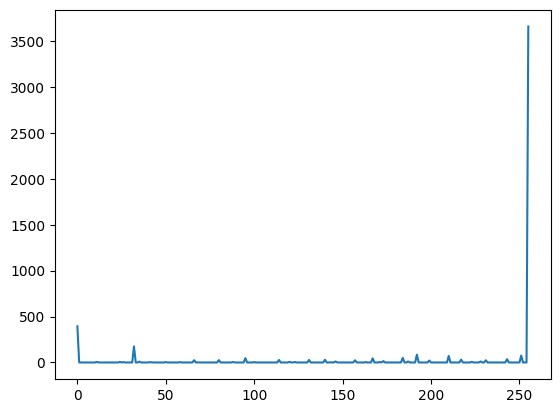

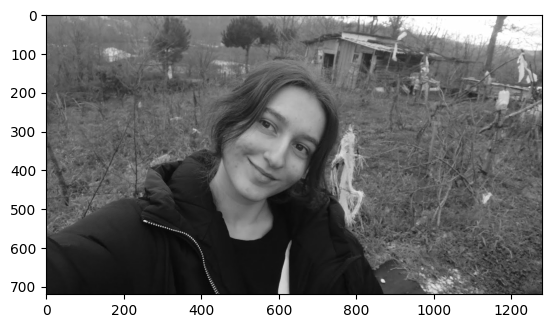

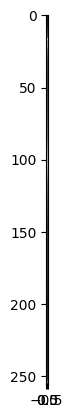

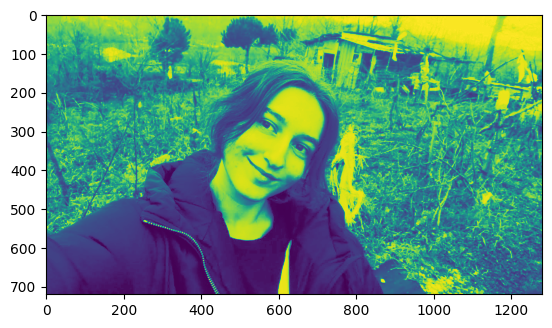

In [66]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import warnings
from google.colab.patches import cv2_imshow

#histogram
img=cv2.imread("nuray.jpg")
img_vis=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.figure(),plt.imshow(img_vis)
print(img.shape)
img_hist=cv2.calcHist([img],channels=[0],mask=None,histSize=[256],ranges=[0,256])
print(img_hist.shape)
plt.figure(),plt.plot(img_hist)
color=("b","g","r")
plt.figure()
for i,c in enumerate(color):
   hist=cv2.calcHist([img],channels=[i],mask=None,histSize=[256],ranges=[0,256])
   plt.plot(hist,color=c)

#maskelemele
golden_gate=cv2.imread("download.png")
golden_gate_vis=cv2.cvtColor(golden_gate,cv2.COLOR_BGR2RGB)
plt.figure(),plt.imshow(golden_gate_vis)

print(golden_gate.shape)

mask=np.zeros(golden_gate.shape[:2],np.uint8)
plt.figure(),plt.imshow(mask,cmap="gray")

mask[150:200, 100:200]=255
plt.figure(),plt.imshow(mask,cmap="gray")

masked_img_vis=cv2.bitwise_and(golden_gate_vis,golden_gate_vis,mask=mask)
plt.figure(),plt.imshow(masked_img_vis,cmap="gray")



masked_img = cv2.bitwise_and(golden_gate_vis, golden_gate_vis, mask=mask)
masked_img_hist = cv2.calcHist([golden_gate], channels=[0], mask=mask, histSize=[256], ranges=[0, 256])
plt.figure()
plt.plot(masked_img_hist)

#histogram eşitleme
#karşıtlık artırma
img=cv2.imread("nuray.jpg",0)
plt.figure(),plt.imshow(img,cmap="gray")

img_hist= cv2.calcHist([img], channels=[0], mask=None, histSize=[256], ranges=[0, 256])
plt.figure(),plt.imshow(img_hist)

eq_hist=cv2.equalizeHist(img)
plt.figure(),plt.imshow(eq_hist)








